In [177]:
import torch
from pathlib import Path
import requests
import zipfile
DATA_PATH = Path("data/")
IMAGE_PATH = DATA_PATH / "pizza-steak-sushi"

if IMAGE_PATH.is_dir():
  pass
else:
  print("Creating the data/pizza-steak-sushi directory...")
  IMAGE_PATH.mkdir(parents=True, exist_ok=True)
  request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/refs/heads/main/data/pizza_steak_sushi.zip")
  with open(DATA_PATH / "pizza-steak-sushi.zip", "wb") as f:
    f.write(request.content)

with zipfile.ZipFile(DATA_PATH / "pizza-steak-sushi.zip", 'r') as zip_ref:
  zip_ref.extractall(IMAGE_PATH)

import os

def walk_dir(dir_path):
  for dirpath, dirname, filename in os.walk(dir_path):
    print(f"There are {len(dirname)} directiories and there are {len(filename)} files in '{dirpath}'")

In [178]:
walk_dir(DATA_PATH)

There are 1 directiories and there are 2 files in 'data'
There are 2 directiories and there are 0 files in 'data/pizza-steak-sushi'
There are 3 directiories and there are 0 files in 'data/pizza-steak-sushi/train'
There are 0 directiories and there are 78 files in 'data/pizza-steak-sushi/train/pizza'
There are 0 directiories and there are 72 files in 'data/pizza-steak-sushi/train/sushi'
There are 0 directiories and there are 75 files in 'data/pizza-steak-sushi/train/steak'
There are 3 directiories and there are 0 files in 'data/pizza-steak-sushi/test'
There are 0 directiories and there are 25 files in 'data/pizza-steak-sushi/test/pizza'
There are 0 directiories and there are 31 files in 'data/pizza-steak-sushi/test/sushi'
There are 0 directiories and there are 19 files in 'data/pizza-steak-sushi/test/steak'


In [179]:
train_dir = IMAGE_PATH / "train"
test_dir = IMAGE_PATH / "test"

Image name is steak
Image height is 512
Image width is 512


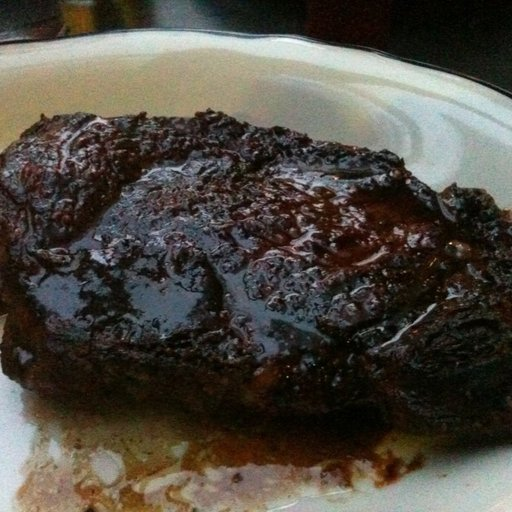

In [180]:
import random
from PIL import Image
image_path_list = list(IMAGE_PATH.glob('*/*/*.jpg'))
random_image_path = random.choice(image_path_list)
random_image_path

img = Image.open(random_image_path)
img_class = random_image_path.parent.stem
print(f'Image name is {img_class}')
print(f'Image height is {img.height}')
print(f'Image width is {img.width}')
img

<Figure size 1400x900 with 0 Axes>

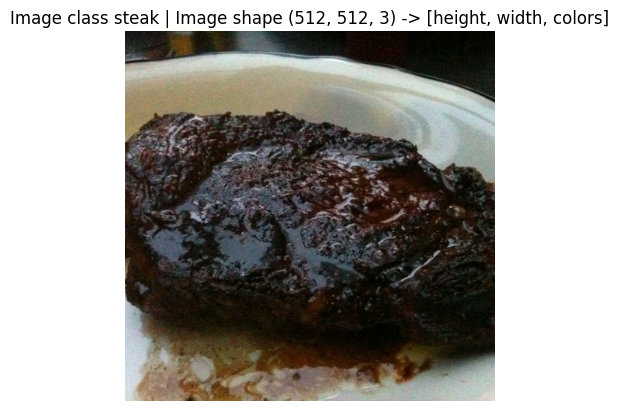

<Figure size 1400x900 with 0 Axes>

In [181]:
import matplotlib.pyplot as plt
import numpy as np

img_as_array = np.asarray(img)
plt.imshow(img_as_array)
plt.title(f"Image class {img_class} | Image shape {img_as_array.shape} -> [height, width, colors]")
plt.axis(False)
plt.figure(figsize=(14,9))

array([[[ 22,  31,  30],
        [ 20,  29,  28],
        [ 20,  26,  24],
        ...,
        [  3,   2,   0],
        [  3,   2,   0],
        [  4,   3,   0]],

       [[ 13,  22,  21],
        [  9,  18,  17],
        [ 13,  19,  19],
        ...,
        [  5,   4,   0],
        [  6,   5,   1],
        [  7,   6,   2]],

       [[  9,  14,  17],
        [  9,  15,  15],
        [ 12,  16,  17],
        ...,
        [  7,   6,   2],
        [  8,   7,   3],
        [  9,   8,   4]],

       ...,

       [[216, 224, 227],
        [213, 221, 224],
        [211, 219, 221],
        ...,
        [215, 217, 206],
        [216, 218, 207],
        [217, 220, 209]],

       [[217, 222, 226],
        [215, 220, 224],
        [211, 219, 221],
        ...,
        [218, 219, 211],
        [222, 223, 215],
        [224, 225, 217]],

       [[208, 213, 217],
        [208, 213, 217],
        [206, 214, 216],
        ...,
        [220, 220, 212],
        [223, 224, 216],
        [225, 226, 218]]], dtype=uint8)
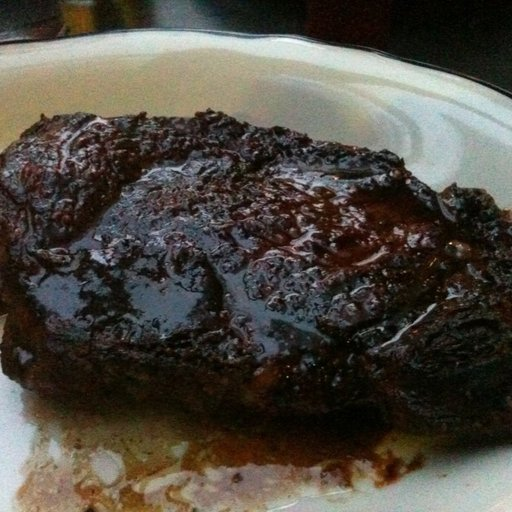

In [182]:
img_as_array

In [183]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

data_transform = transforms.Compose([
    transforms.Resize(size=(64,64)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

data_transform(img)

tensor([[[0.0824, 0.0863, 0.0824,  ..., 0.0235, 0.0235, 0.0235],
         [0.1020, 0.1137, 0.1098,  ..., 0.0196, 0.0196, 0.0235],
         [0.1412, 0.1451, 0.1294,  ..., 0.0235, 0.0235, 0.0196],
         ...,
         [0.8314, 0.8118, 0.6980,  ..., 0.7451, 0.7608, 0.7725],
         [0.8314, 0.7961, 0.7098,  ..., 0.7608, 0.8039, 0.8196],
         [0.8314, 0.7961, 0.7529,  ..., 0.8078, 0.8392, 0.8471]],

        [[0.0902, 0.0980, 0.0980,  ..., 0.0196, 0.0235, 0.0235],
         [0.1216, 0.1176, 0.1176,  ..., 0.0275, 0.0275, 0.0314],
         [0.1608, 0.1569, 0.1451,  ..., 0.0275, 0.0275, 0.0353],
         ...,
         [0.8706, 0.8157, 0.6039,  ..., 0.7882, 0.7882, 0.7922],
         [0.8667, 0.7922, 0.6314,  ..., 0.7922, 0.8118, 0.8235],
         [0.8627, 0.8039, 0.7059,  ..., 0.8118, 0.8235, 0.8392]],

        [[0.0902, 0.0863, 0.0784,  ..., 0.0039, 0.0078, 0.0078],
         [0.1098, 0.1137, 0.1020,  ..., 0.0078, 0.0078, 0.0118],
         [0.1412, 0.1412, 0.1216,  ..., 0.0118, 0.0118, 0.

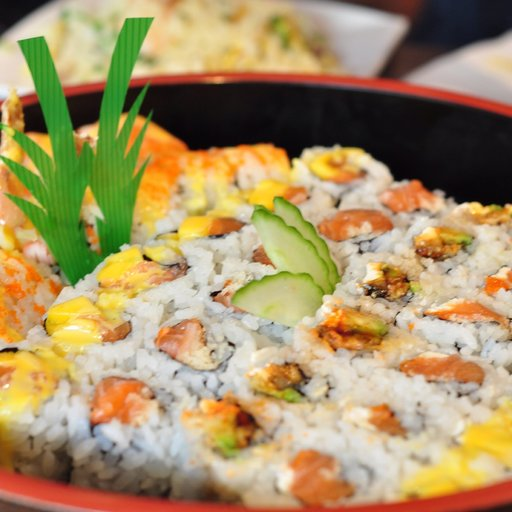

In [184]:
Image.open(image_path_list[78])

In [185]:
def plot_transform_images(
    image_path_list: list,
    transform,
    n=3,
    seed=None
):
  if seed:
    torch.manual_seed(seed)
  rand_img_path_list = random.sample(image_path_list, k=n)
  for rand_img in rand_img_path_list:
    with Image.open(rand_img) as f:
      fig, ax = plt.subplots(nrows=1, ncols=2)
      ax[0].imshow(f)
      ax[0].set_title(f"Original Image\nSize: {f.size}")
      ax[0].axis(False)

      transformed_img = transform(f).permute(1,2,0)
      ax[1].imshow(transformed_img)
      ax[1].set_title(f"Transformed Image\nShape: {transformed_img.shape}")
      ax[1].axis("off")

      class_name = rand_img.parent.stem
      fig.suptitle(f"Class: {class_name}", fontsize=16)


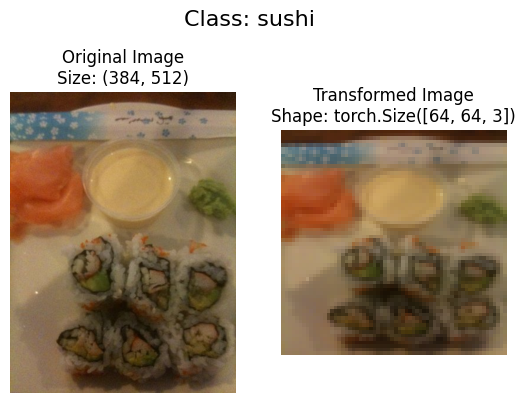

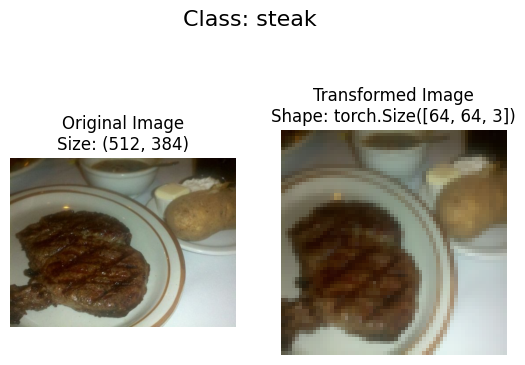

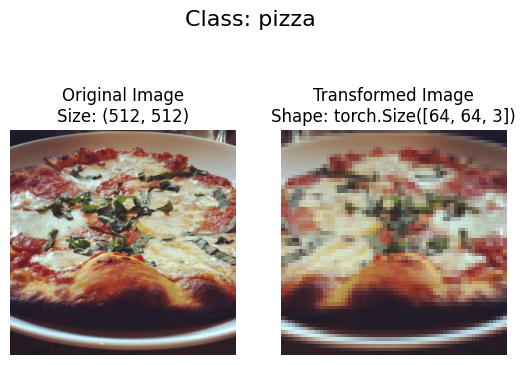

In [186]:
plot_transform_images(image_path_list, data_transform, seed=42)

In [187]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=data_transform,
                                  target_transform=None)

test_data = datasets.ImageFolder(root=test_dir,
                                 transform=data_transform)

In [188]:
len(train_data), len(test_data)

(225, 75)

In [189]:
img, label = train_data[0][0], train_data[0][1]

print(f"Train data shape -> {img.size}")
print(f"Image shape -> {img.shape}")
print(f"Image dtype -> {img.dtype}")
print(f"Label type -> {type(label)}")
print(f"Image tensor -> {img}")

Train data shape -> <built-in method size of Tensor object at 0x7e17adf70bd0>
Image shape -> torch.Size([3, 64, 64])
Image dtype -> torch.float32
Label type -> <class 'int'>
Image tensor -> tensor([[[0.1176, 0.1216, 0.1255,  ..., 0.0980, 0.1020, 0.1137],
         [0.1294, 0.1294, 0.1294,  ..., 0.0980, 0.0980, 0.1059],
         [0.1333, 0.1333, 0.1333,  ..., 0.0941, 0.0980, 0.1020],
         ...,
         [0.1686, 0.1647, 0.1686,  ..., 0.1255, 0.1098, 0.1098],
         [0.1686, 0.1647, 0.1686,  ..., 0.1098, 0.0941, 0.0902],
         [0.1647, 0.1647, 0.1686,  ..., 0.0980, 0.0863, 0.0863]],

        [[0.0588, 0.0588, 0.0588,  ..., 0.0745, 0.0706, 0.0745],
         [0.0627, 0.0627, 0.0627,  ..., 0.0745, 0.0706, 0.0745],
         [0.0706, 0.0706, 0.0706,  ..., 0.0745, 0.0745, 0.0706],
         ...,
         [0.2392, 0.2392, 0.2510,  ..., 0.1373, 0.1333, 0.1255],
         [0.2314, 0.2392, 0.2510,  ..., 0.1255, 0.1176, 0.1098],
         [0.2275, 0.2353, 0.2431,  ..., 0.1137, 0.1059, 0.1020]],

In [190]:
class_dict = train_data.class_to_idx

In [191]:
class_names = train_data.classes


In [192]:
img_permuted = img.permute(1,2,0)

(-0.5, 63.5, 63.5, -0.5)

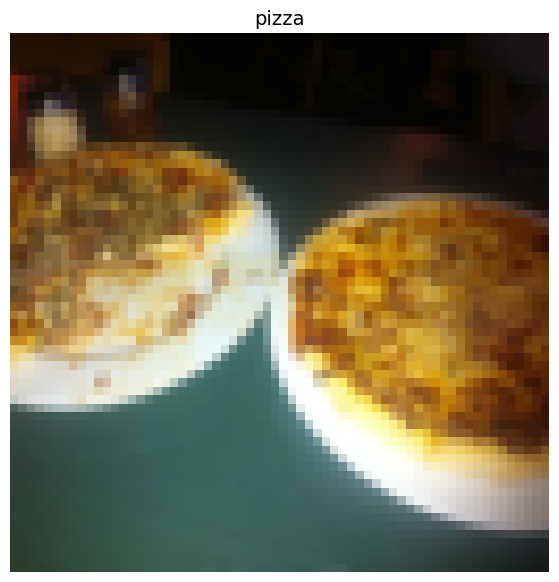

In [193]:
plt.figure(figsize=(10,7))
plt.title(class_names[label], fontsize=14)
plt.imshow(img_permuted)
plt.axis("off")

In [194]:
class_dict

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [195]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_dataloader = DataLoader(dataset=train_data,
                               batch_size=BATCH_SIZE,
                               num_workers=os.cpu_count())

test_dataloader = DataLoader(dataset=test_data,
                              batch_size=BATCH_SIZE,
                              num_workers=os.cpu_count())

In [196]:
len(train_dataloader), len(test_dataloader)

(8, 3)

In [197]:
img, label = next(iter(train_dataloader))

In [198]:
import os
def find_classes(target_dir: str):
  classes = sorted([entry.name for entry in list(os.scandir(target_dir)) if entry.is_dir()])

  if not classes:
    raise FileNotFoundError("Classes doesn't exist!")
  class_to_idx = {class_name: i for i, class_name in enumerate(classes)}

  return classes, class_to_idx

In [199]:
find_classes(train_dir)

(['pizza', 'steak', 'sushi'], {'pizza': 0, 'steak': 1, 'sushi': 2})

In [200]:
from torch.utils.data import Dataset
from typing import Tuple, List

In [201]:
class ImageFolderCustom(Dataset):
    def __init__(self, target_dir: str, transform=None):
        self.paths = list(Path(target_dir).glob("*/*.jpg"))  # expects train/pizza/image.jpg
        self.transform = transform
        self.classes, self.class_to_idx = find_classes(target_dir)

    def load_image(self, idx: int):
        img_path = self.paths[idx]
        return Image.open(img_path)

    def __len__(self) -> int:
        return len(self.paths)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, int]:  # Update the return type
        self.img = self.load_image(idx)
        self.class_name = self.paths[idx].parent.name
        self.class_idx = self.class_to_idx[self.class_name]

        if self.transform:
            self.img = self.transform(self.img)

        return self.img, self.class_idx # Return class name along with image and index


In [202]:
from torchvision import transforms
train_transforms = transforms.Compose([transforms.Resize(size=(64,64)),
                                      transforms.RandomHorizontalFlip(p=0.5),
                                      transforms.ToTensor()])

test_transforms = transforms.Compose([transforms.Resize(size=(64,64)),
                                     transforms.RandomHorizontalFlip(p=0.5),
                                     transforms.ToTensor()])

In [203]:
train_data_custom = ImageFolderCustom(target_dir = train_dir,
                                      transform = train_transforms)

test_data_custom = ImageFolderCustom(target_dir = test_dir,
                                     transform = train_transforms)

In [204]:
train_data_custom.classes

['pizza', 'steak', 'sushi']

torch.Size([3, 64, 64])


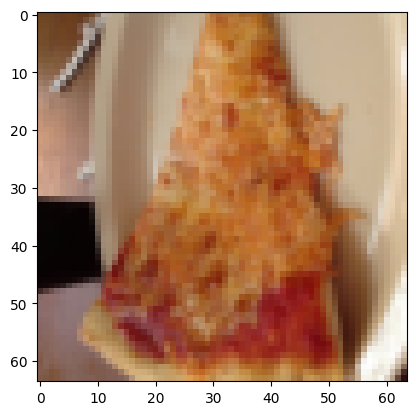

In [205]:
img, class_idx= train_data_custom.__getitem__(2)

print(img.shape)  # This will print the class name.
img = img.permute(2,1,0)
plt.imshow(img)

In [206]:
for data in train_data_custom:
  print(data)
  break

(tensor([[[0.9216, 0.8745, 0.7098,  ..., 0.2431, 0.5020, 0.5059],
         [0.8902, 0.7490, 0.6941,  ..., 0.2353, 0.5020, 0.5451],
         [0.8314, 0.8000, 0.8078,  ..., 0.4000, 0.5529, 0.5647],
         ...,
         [0.9686, 0.9725, 0.9608,  ..., 0.8118, 0.8510, 0.8431],
         [0.9608, 0.9608, 0.9608,  ..., 0.7412, 0.7333, 0.6196],
         [0.9608, 0.9569, 0.9608,  ..., 0.7725, 0.7176, 0.5216]],

        [[0.8549, 0.7765, 0.5412,  ..., 0.1216, 0.2667, 0.2588],
         [0.7922, 0.5882, 0.4824,  ..., 0.1098, 0.2706, 0.2902],
         [0.6784, 0.6275, 0.6471,  ..., 0.2157, 0.3137, 0.3176],
         ...,
         [0.8157, 0.8196, 0.8078,  ..., 0.6235, 0.6627, 0.6431],
         [0.8118, 0.8157, 0.8118,  ..., 0.5294, 0.5412, 0.4627],
         [0.8157, 0.8078, 0.8078,  ..., 0.5569, 0.4941, 0.3882]],

        [[0.7176, 0.6118, 0.3569,  ..., 0.0627, 0.1098, 0.1020],
         [0.6431, 0.4000, 0.2745,  ..., 0.0549, 0.1098, 0.1098],
         [0.5216, 0.4510, 0.4667,  ..., 0.0863, 0.1098, 0

In [207]:
from typing import Tuple

In [208]:
class_names

['pizza', 'steak', 'sushi']

In [209]:
def display_rand_img(dataset: torch.utils.data.Dataset,
                  class_names: List,
                  n: int = 10,
                  display_shape: bool = None,
                  seed: int = None):
  if seed:
    torch.manual_seed(42)
  if n > 10:
    n = 10
    print(f"Due to the n > 10, shape won't appear!")
    display_shape = False
  plt.figure(figsize=(14,6))
  target_samples_idx = random.sample(range(len(dataset)), k=n)
  for i, target_sample in enumerate(target_samples_idx):
    target_img, target_label = train_data[target_sample]
    targ_img_adjust = target_img.permute(1,2,0)
    plt.subplot(1, n, i+1)
    plt.imshow(targ_img_adjust)
    if class_names:
      title = f"Class: {class_names[target_label]}"
      if display_shape:
        title += f"\nShape: {targ_img_adjust.shape}"
    plt.title(title)
    plt.axis("off")

Due to the n > 10, shape won't appear!


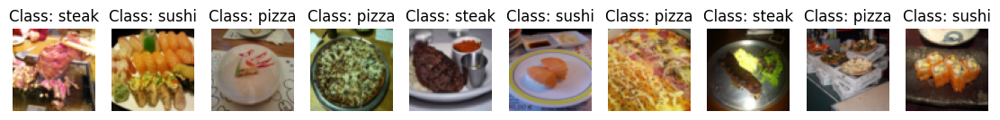

In [210]:
display_rand_img(train_data,
                 class_names=class_names,
                 n=1000000,
                 display_shape=True,
                 seed=42)

In [211]:
from torch.utils.data import DataLoader
import os

BATCH_SIZE = 32
train_dataloader_custom = DataLoader(train_data,
                                     batch_size=BATCH_SIZE,
                                     shuffle = True,
                                     num_workers=os.cpu_count())

test_dataloader_custom = DataLoader(test_data,
                                     batch_size=BATCH_SIZE,
                                     shuffle = True,
                                     num_workers=os.cpu_count())

In [212]:
train_dataloader_custom

In [213]:
img_custom, label_custom = next(iter(train_dataloader_custom))
img_custom.shape

torch.Size([32, 3, 64, 64])

In [214]:
from torchvision import transforms

train_transform = transforms.Compose([transforms.Resize(size=(224,224)),
                    transforms.TrivialAugmentWide(num_magnitude_bins=31),
                    transforms.ToTensor()])

test_transform = transforms.Compose([transforms.Resize(size=(224,224)),
                                    transforms.TrivialAugmentWide(num_magnitude_bins = 31),
                                    transforms.ToTensor()])


<ipython-input-185-4c28edcf2995>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=2)


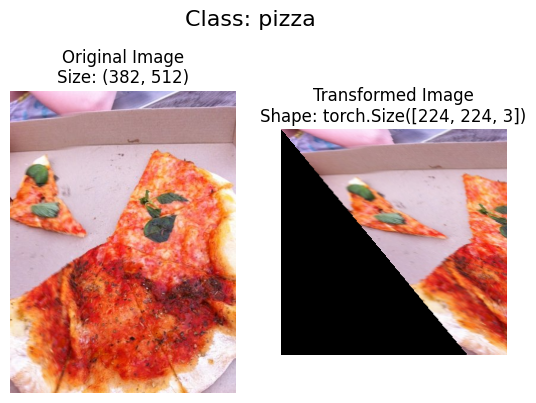

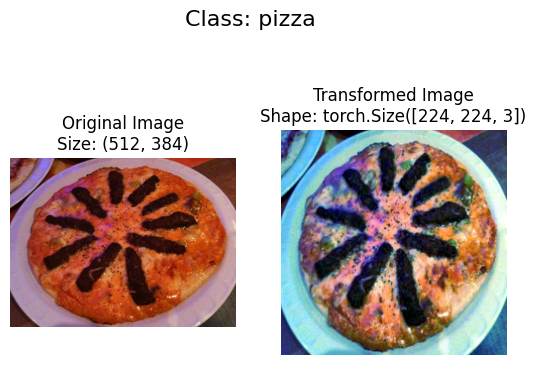

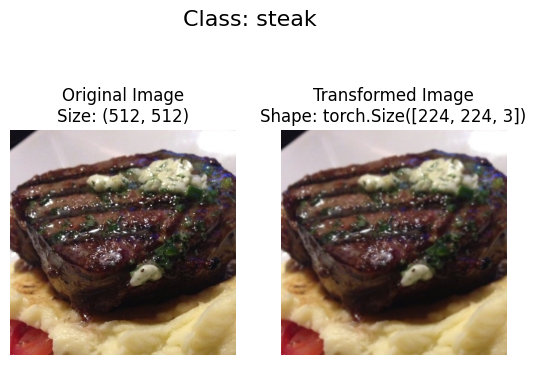

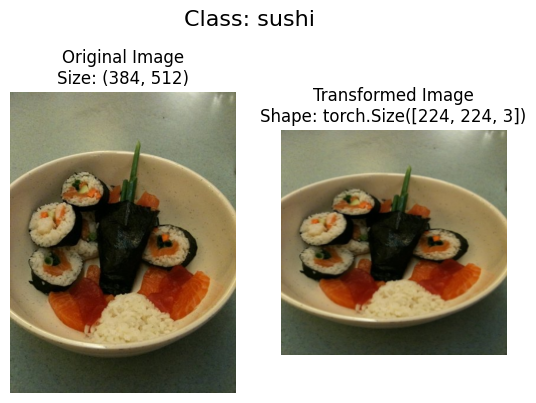

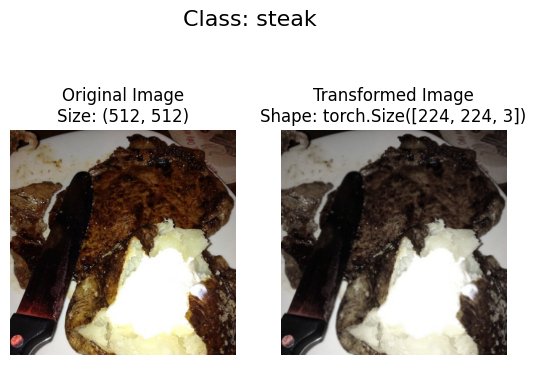

...

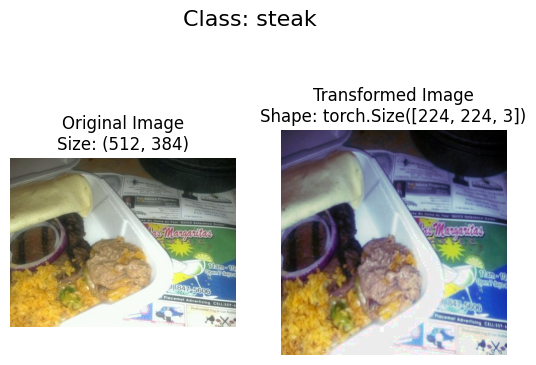

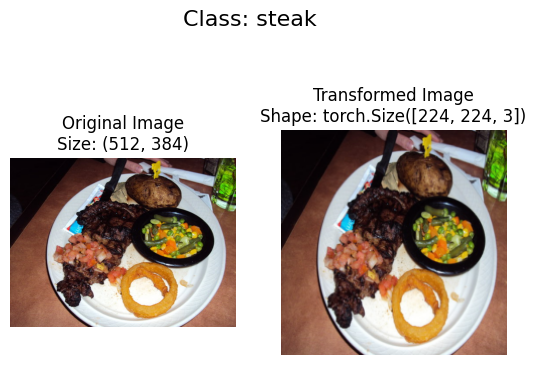

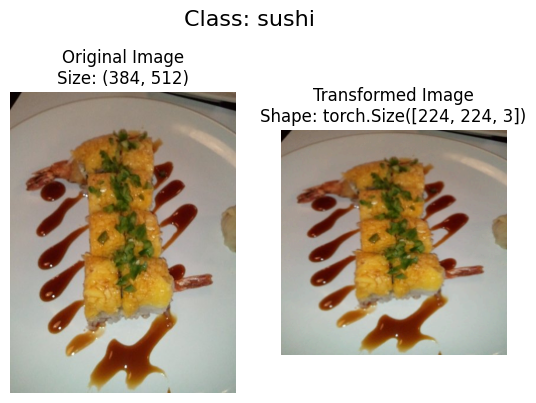

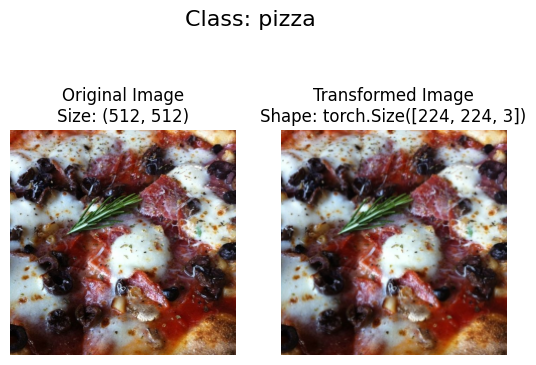

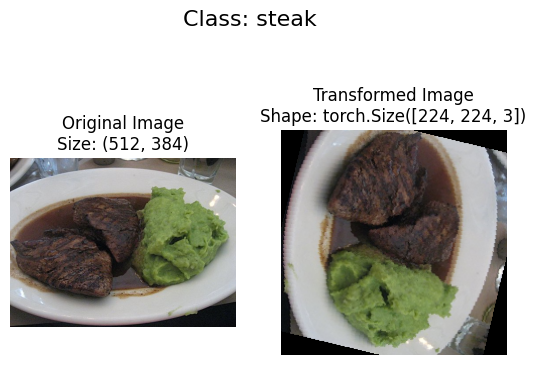

In [215]:
# plot the random images

plot_transform_images(
    transform=train_transform,
    image_path_list=image_path_list,
    n=30,
)

In [216]:
from torch import nn

In [217]:
class TinyVGG(nn.Module):
  def __init__(self,
               input_shape,
               hidden_units,
               output_shape):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        nn.Conv2d(input_shape,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),

        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,
                     stride=2),
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),

        nn.Conv2d(hidden_units,
                  hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=0),
        nn.ReLU(),
        nn.MaxPool2d(
            kernel_size=2,
            stride=2)
        )

    self.classifier = nn.Sequential(
          nn.Flatten(),
          nn.Linear(in_features=hidden_units*13*13,
                    out_features=output_shape)
        )
  def forward(self, x):
      return self.classifier(self.conv_block_2(self.conv_block_1(x)))

In [218]:
class_names

['pizza', 'steak', 'sushi']

In [219]:
torch.manual_seed(42)
model_0 = TinyVGG(input_shape=3,
                  hidden_units=10,
                  output_shape=len(class_names))

model_0

TinyVGG(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=1690, out_features=3, bias=True)
  )
)

In [220]:
image_batch, label_batch = next(iter(train_dataloader_custom))
image_batch.shape, len(label_batch)

(torch.Size([32, 3, 64, 64]), 32)

In [221]:
# Try a forward pass
model_0(image_batch)

tensor([[ 2.0795e-02, -1.9510e-03,  9.5212e-03],
        [ 1.9347e-02,  3.1597e-03,  7.4474e-03],
        [ 1.7695e-02,  1.0282e-03,  9.4975e-03],
        [ 2.1068e-02, -2.6110e-03,  1.0277e-02],
        [ 1.9939e-02,  6.9131e-04,  1.0778e-02],
        [ 2.1281e-02,  2.0434e-03,  5.0046e-03],
        [ 2.0996e-02,  1.6415e-04,  1.2481e-02],
        [ 2.1566e-02, -1.9607e-03,  9.7175e-03],
        [ 2.4500e-02, -4.7904e-03,  8.5394e-03],
        [ 1.9275e-02, -1.7611e-04,  8.9663e-03],
        [ 1.9972e-02, -2.9622e-03,  8.2557e-03],
        [ 2.2318e-02, -2.1642e-03,  9.4428e-03],
        [ 2.1851e-02, -3.7225e-03,  8.3784e-03],
        [ 2.2881e-02, -1.7559e-03,  1.0299e-02],
        [ 2.1635e-02, -4.3995e-03,  9.4990e-03],
        [ 2.2589e-02, -3.4084e-03,  1.0640e-02],
        [ 2.0182e-02, -2.1775e-03,  9.5757e-03],
        [ 2.1698e-02, -2.7458e-03,  8.4966e-03],
        [ 1.9974e-02, -3.1665e-07,  8.4496e-03],
        [ 1.8308e-02,  1.6378e-03,  8.5491e-03],
        [ 1.7433e-02

In [222]:
!pip install torchinfo

In [223]:
from torchinfo import summary

summary(model_0, input_size=[1,3,64,64])

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [1, 3]                    --
├─Sequential: 1-1                        [1, 10, 30, 30]           --
│    └─Conv2d: 2-1                       [1, 10, 62, 62]           280
│    └─ReLU: 2-2                         [1, 10, 62, 62]           --
│    └─Conv2d: 2-3                       [1, 10, 60, 60]           910
│    └─ReLU: 2-4                         [1, 10, 60, 60]           --
│    └─MaxPool2d: 2-5                    [1, 10, 30, 30]           --
├─Sequential: 1-2                        [1, 10, 13, 13]           --
│    └─Conv2d: 2-6                       [1, 10, 28, 28]           910
│    └─ReLU: 2-7                         [1, 10, 28, 28]           --
│    └─Conv2d: 2-8                       [1, 10, 26, 26]           910
│    └─ReLU: 2-9                         [1, 10, 26, 26]           --
│    └─MaxPool2d: 2-10                   [1, 10, 13, 13]           --
├─Sequentia

In [224]:
from tqdm.auto import tqdm

In [225]:
len(train_dataloader)

8

In [226]:
def train_step(model: torch.nn.Module,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               data_loader: torch.utils.data):
  train_acc, train_loss = 0, 0
  model.train()

  for (X, y) in data_loader:
    y_train_logits = model(X)

    loss = loss_fn(y_train_logits, y)
    train_loss += loss.item()

    y_pred_labels = torch.argmax(torch.softmax(y_train_logits, dim=1), dim=1)

    train_acc += (y == y_pred_labels).sum().item() / len(y_train_logits)

    optimizer.zero_grad()

    loss.backward()

    optimizer.step()

  train_loss /= len(data_loader)
  train_acc /= len(data_loader)
  return train_loss, train_acc

In [227]:
def test_step(model: torch.nn.Module,
              loss_fn: torch.nn.Module,
              optimizer: torch.optim.Optimizer,
              data_loader: torch.utils.data):
  test_loss, test_acc = 0, 0

  model.eval()
  with torch.inference_mode():
    for (X, y) in data_loader:
      y_test_logits = model(X)
      y_test_pred_labels = torch.argmax(torch.softmax(y_test_logits, dim=1), dim=1)

      loss = loss_fn(y_test_logits, y)
      test_loss += loss.item()
      test_acc += (y_test_pred_labels == y).sum().item() / len(y_test_logits)

  test_loss /= len(data_loader)
  test_acc /= len(data_loader)
  return test_loss, test_acc

In [228]:
def train_model(model: torch.nn.Module,
          loss_fn: torch.nn.Module,
          optimizer: torch.optim.Optimizer,
          train_dataloader: torch.utils.data,
          test_dataloader: torch.utils.data,
          epochs: int = 5):

  results = {
      "train_loss": [],
      "train_acc": [],
      "test_loss": [],
      "test_acc": []
  }

  for epoch in tqdm(range(epochs)):

    train_loss, train_acc = train_step(model, loss_fn, optimizer, train_dataloader)
    test_loss, test_acc = test_step(model, loss_fn, optimizer, test_dataloader)

    results["train_loss"].append(train_loss)
    results["train_acc"].append(train_acc)
    results["test_loss"].append(test_loss)
    results["test_acc"].append(test_acc)

    print(f"Epoc: {epoch} | Train loss {train_loss:.4f}, Train acc {train_acc:.4f} | Test loss {test_loss:.4f}, Test acc {test_acc:.4f}")
  return results

In [229]:
train_data

Dataset ImageFolder
    Number of datapoints: 225
    Root location: data/pizza-steak-sushi/train
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )

In [230]:
NUM_EPOCHS = 5

model_0 = TinyVGG(3, 10, len(train_data.classes))

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_0.parameters(), lr= 0.01)

model_0_results = train_model(model_0, loss_fn, optimizer, train_dataloader_custom, test_dataloader_custom, epochs = NUM_EPOCHS)
import pandas as pd
df = pd.DataFrame(model_0_results)
print(df)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoc: 0 | Train loss 1.1265, Train acc 0.4062 | Test loss 1.0989, Test acc 0.2973
Epoc: 1 | Train loss 1.0946, Train acc 0.4141 | Test loss 1.1058, Test acc 0.2377
Epoc: 2 | Train loss 1.0845, Train acc 0.4336 | Test loss 1.1201, Test acc 0.3201
Epoc: 3 | Train loss 1.1706, Train acc 0.2969 | Test loss 1.1097, Test acc 0.2775
Epoc: 4 | Train loss 1.0902, Train acc 0.4141 | Test loss 1.1160, Test acc 0.2775
   train_loss  train_acc  test_loss  test_acc
0    1.126539   0.406250   1.098860  0.297348
1    1.094576   0.414062   1.105840  0.237689
2    1.084478   0.433594   1.120079  0.320076
3    1.170557   0.296875   1.109675  0.277462
4    1.090174   0.414062   1.116028  0.277462


In [231]:
def plot_the_curves(results):
  train_loss = results["train_loss"]
  train_acc = results["train_acc"]
  test_loss = results["test_loss"]
  test_acc = results["test_acc"]
  epochs = range(len(train_loss))

  plt.figure(figsize=(15,7))

  plt.subplot(1,2,1)
  plt.plot(epochs, train_loss, label="train_loss")
  plt.plot(epochs, test_loss, label="test_loss")
  plt.title("Loss")
  plt.xlabel("Epochs")
  plt.legend()

  plt.subplot(1,2,2)
  plt.plot(epochs, train_acc, label="train_accuracy")
  plt.plot(epochs, test_acc, label="test_accuracy")
  plt.title("Accuracy")
  plt.xlabel("Epochs")
  plt.legend()

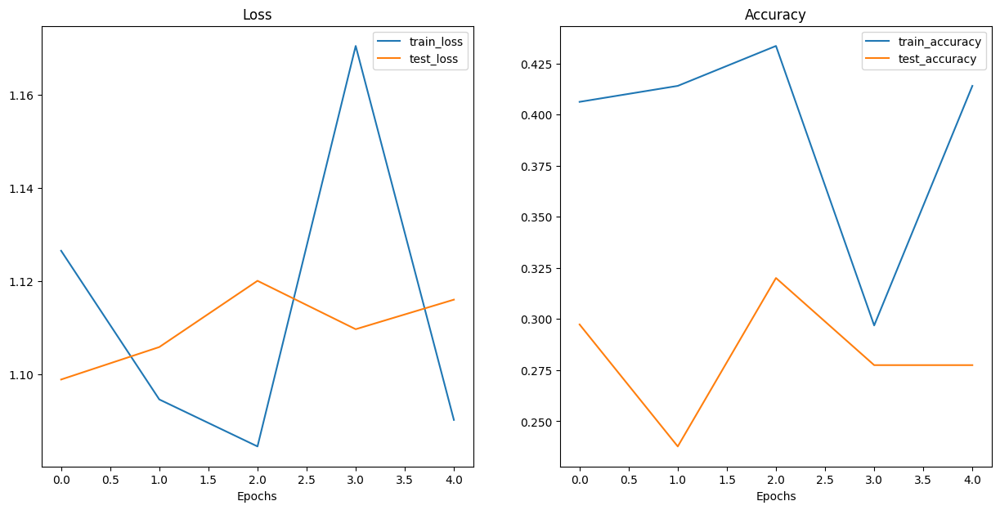

In [232]:
plot_the_curves(model_0_results)

In [233]:
from torchvision import transforms

train_transform_trivial = transforms.Compose([
                                               transforms.Resize(size=(64,64)),
                                               transforms.TrivialAugmentWide(num_magnitude_bins=31),
                                               transforms.ToTensor()
])

test_transform_simple = transforms.Compose([transforms.Resize(size=(64,64)),
                                               transforms.ToTensor()])

In [234]:
from torch.utils.data import DataLoader
from torchvision import datasets
import os
train_data_augment = datasets.ImageFolder(root=train_dir,
                                          transform=train_transform_trivial)

test_data_simple = datasets.ImageFolder(root=test_dir,
                                        transform=test_transform_simple)

In [235]:
train_dataloader = DataLoader(train_data_augment,
                              batch_size=32,
                              shuffle= True,
                              num_workers=os.cpu_count())

test_dataloader = DataLoader(test_data_simple,
                             batch_size=32,
                             shuffle= True,
                             num_workers=os.cpu_count())

In [236]:
from timeit import default_timer as timer

NUM_ECPOHS = 5

torch.manual_seed(42)

model_1 = TinyVGG(3,
                  10,
                  len(train_data_augment.classes))

start_timer = timer()

model_1_results = train_model(model_1,
                              loss_fn,
                              optimizer,
                              train_dataloader,
                              test_dataloader,
                              NUM_EPOCHS)

end_timer = timer()

print(f"Total training time for model_1: {(end_timer - start_timer):.4f}")

  0%|          | 0/5 [00:00<?, ?it/s]

Epoc: 0 | Train loss 1.0982, Train acc 0.3047 | Test loss 1.0968, Test acc 0.3797
Epoc: 1 | Train loss 1.0976, Train acc 0.3047 | Test loss 1.0980, Test acc 0.3002
Epoc: 2 | Train loss 1.0994, Train acc 0.3047 | Test loss 1.0971, Test acc 0.3598
Epoc: 3 | Train loss 1.0978, Train acc 0.3047 | Test loss 1.0971, Test acc 0.3598
Epoc: 4 | Train loss 1.0964, Train acc 0.4258 | Test loss 1.0974, Test acc 0.3002
Total training time for model_1: 15.1440


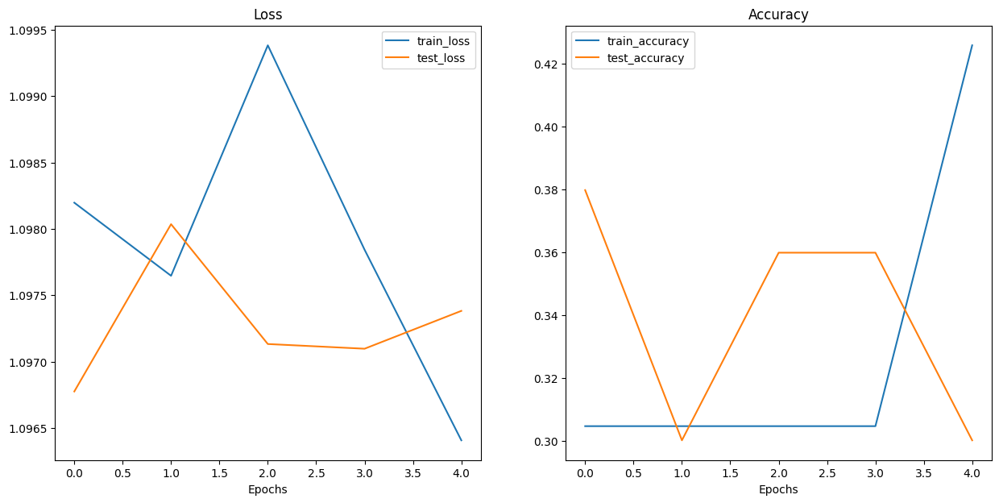

In [237]:
plot_the_curves(model_1_results)

In [238]:
import pandas as pd

result_0_df = pd.DataFrame(model_0_results)
result_1_df = pd.DataFrame(model_1_results)

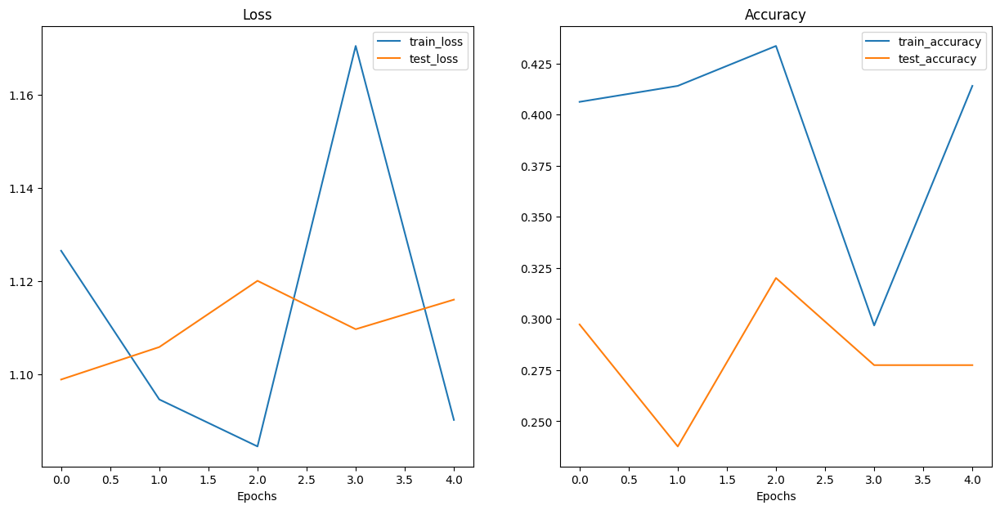

In [239]:
plot_the_curves(model_0_results)

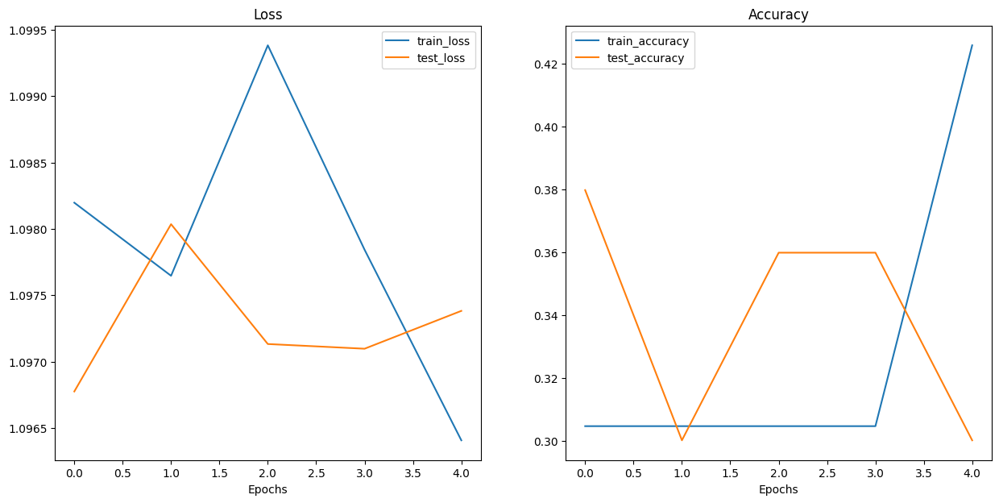

In [240]:
plot_the_curves(model_1_results)

In [241]:
DATA_PATH

PosixPath('data')

In [242]:
import requests

pizza_dad_path = DATA_PATH / "pizza-dad.jpg"

if not pizza_dad_path.is_file():
  print(f"Downloading in '{pizza_dad_path}' directory...")
  request = requests.get('https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/refs/heads/main/images/04-pizza-dad.jpeg')

  with open(pizza_dad_path, 'wb') as f:
    f.write(request.content)


(-0.5, 3023.5, 4031.5, -0.5)

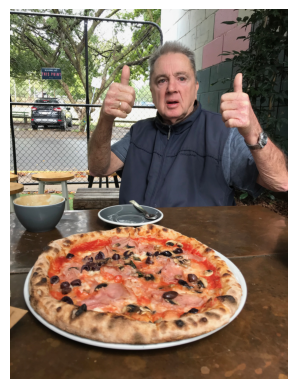

In [243]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread(pizza_dad_path)
plt.imshow(img)
plt.axis("off")

In [244]:
import torchvision

custom_image_uint8 = torchvision.io.read_image(pizza_dad_path)

(custom_image_uint8.shape)

torch.Size([3, 4032, 3024])

(-0.5, 3023.5, 4031.5, -0.5)

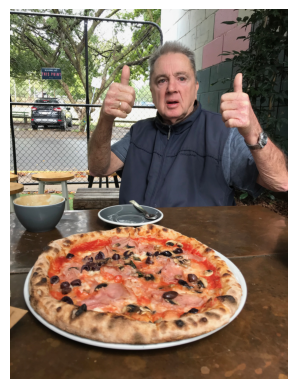

In [245]:
plt.imshow(custom_image_uint8.permute(1,2,0))
plt.axis(False)

In [246]:
import torchvision

img_tensor = torchvision.io.read_image(pizza_dad_path).type(torch.float32) / 255.
img_tensor.shape

torch.Size([3, 4032, 3024])

In [256]:
from PIL import Image
from torchvision import transforms

custom_transform = transforms.Compose([transforms.Resize((64,64)),
                                       transforms.ToTensor()])

img = Image.open(pizza_dad_path)

transformed_image = custom_transform(img)

transformed_image = transformed_image.permute(1,2,0)

In [257]:
transformed_image.shape

torch.Size([64, 64, 3])

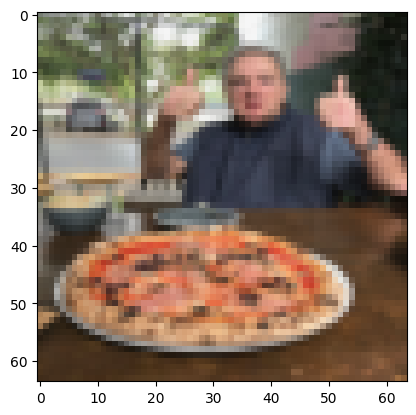

In [258]:
plt.imshow(transformed_image)

AttributeError: 'Compose' object has no attribute 'permute'